In [1]:
import os
import sys
from heapq import heappop, heappush
from itertools import count
from random import randint

sys.path.append('..')

from scripts import graph_osm_loader, clustering
from scripts.filtration import FiltrationClustering


import matplotlib.pyplot as plt
import imageio.v3 as iio
from IPython.display import Image

import igraph as ig
import networkx as nx
import numpy as np

from tqdm.notebook import tqdm


N_JOBS = 16

Medium size cities:
- `R1853866` - 5k
- `KRG` - 3k
- `ASHA` - 715
- `R3305920` - 1k

# Knn graph

In [2]:
# Function for building graph of k-nearest neighbours
def dijkstra_knn(graph: nx.Graph,
                 #  graph_knn: nx.Graph,
                 start: int,
                 k: int,
                 weight:  str = 'length'
                 ):
    adjacency = graph._adj
    c = count()

    push = heappush
    pop = heappop

    dist = {}
    fringe = []
    new_edges = []

    dist[start] = 0.0
    push(fringe, (0.0, next(c), start))

    counter = 0
    while fringe:
        (d, _, v) = pop(fringe)
        # Add closest node except for the start point
        if counter > 0:
            if counter <= k:
                new_edges.append((start, v, d))
                counter += 1
            else:
                return new_edges
        else:
            counter += 1
        # Find closest nodes in the neighbourhood
        for u, e in adjacency[v].items():
            vu_dist = d + e[weight]
            if u not in dist or dist[u] > vu_dist:
                dist[u] = vu_dist
                push(fringe, (vu_dist, next(c), u))


# Function wrap
def build_knn_graph(G, k, weight='length'):
    G_knn = nx.Graph()
    new_edges = []
    for v in G.nodes:
        new_edges += dijkstra_knn(G, v, k, weight=weight)
    G_knn.add_weighted_edges_from(new_edges, weight=weight)
    return G_knn

# ASHA

Text(0.5, 1.0, 'Asha | 723 nodes')

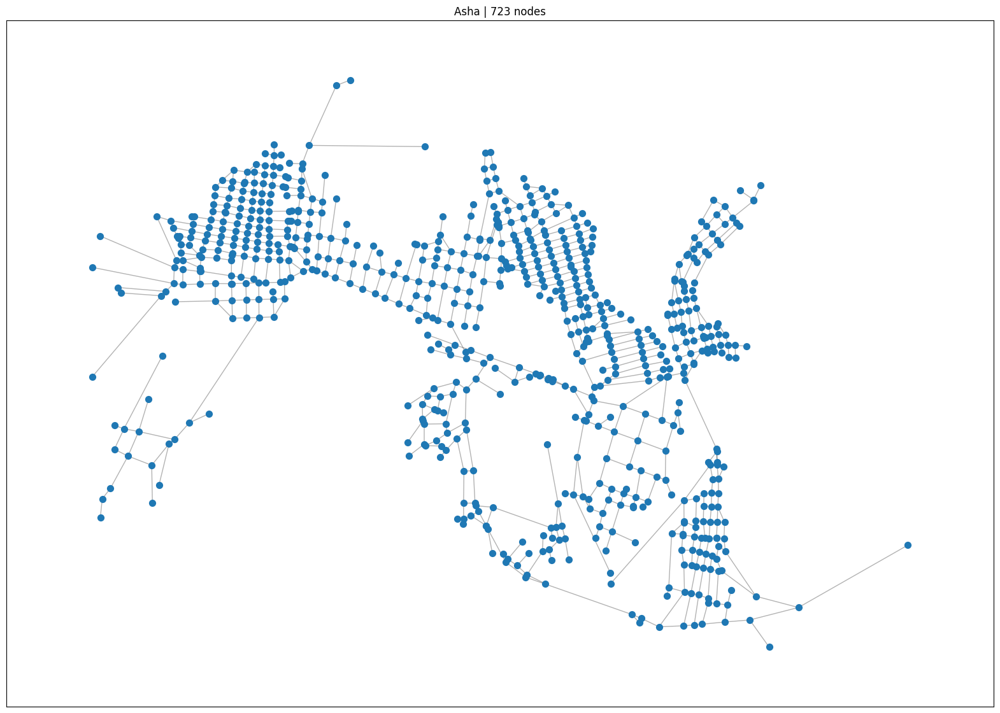

In [3]:
CITY = 'ASHA'
GRAPH_ID = graph_osm_loader.cities[CITY] # KRG

# примеры id есть в graph_osm_loader.py
G = graph_osm_loader.get_graph(GRAPH_ID) # загрузка графа

pos = {u: [d['x'], d['y']] for u,d in G.nodes(data=True)} 

A = nx.adjacency_matrix(G, weight='length').todense()


plt.figure(figsize=(20, 14))
nx.draw_networkx_nodes(G, pos, node_size=50)
nx.draw_networkx_edges(G, pos, alpha=0.3)
plt.title(f'Asha | {len(G.nodes)} nodes')

In [4]:
d_dict = dict(nx.all_pairs_dijkstra_path_length(G, weight='length'))
d_matrix = np.zeros((len(G.nodes), len(G.nodes)))
id_to_order = {id : order for order, id in enumerate(G.nodes)}

for row in d_dict:
    for v in d_dict[row]:
        d_matrix[id_to_order[row]][id_to_order[v]] = d_dict[row][v]

## Louvain

In [5]:
communities = nx.community.louvain_communities(G)
score = nx.community.modularity(G, communities)
print(f'Modularity: {score:.5f}')

Modularity: 0.88485


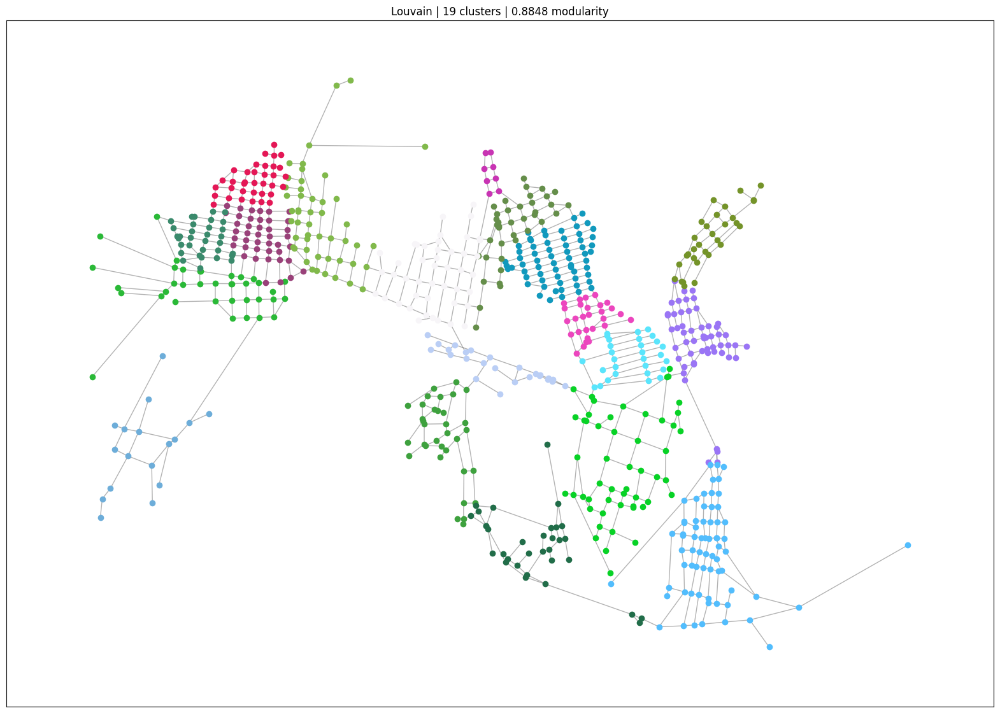

In [6]:
def plot_communities(communities, algo_name=''):
    plt.figure(figsize=(20, 14))

    nx.draw_networkx_edges(G, pos, alpha=0.3)

    for j, cluster in enumerate(communities):
        color = '#%06X' % randint(0, 0xFFFFFF)
        for v in cluster:
            point = pos[v]
            plt.scatter(point[0], point[1], c=color)

    plt.title(f'{algo_name} | {len(communities)} clusters | {score:.4f} modularity')

plot_communities(communities, 'Louvain')

## Leiden

Modularity: 0.92252


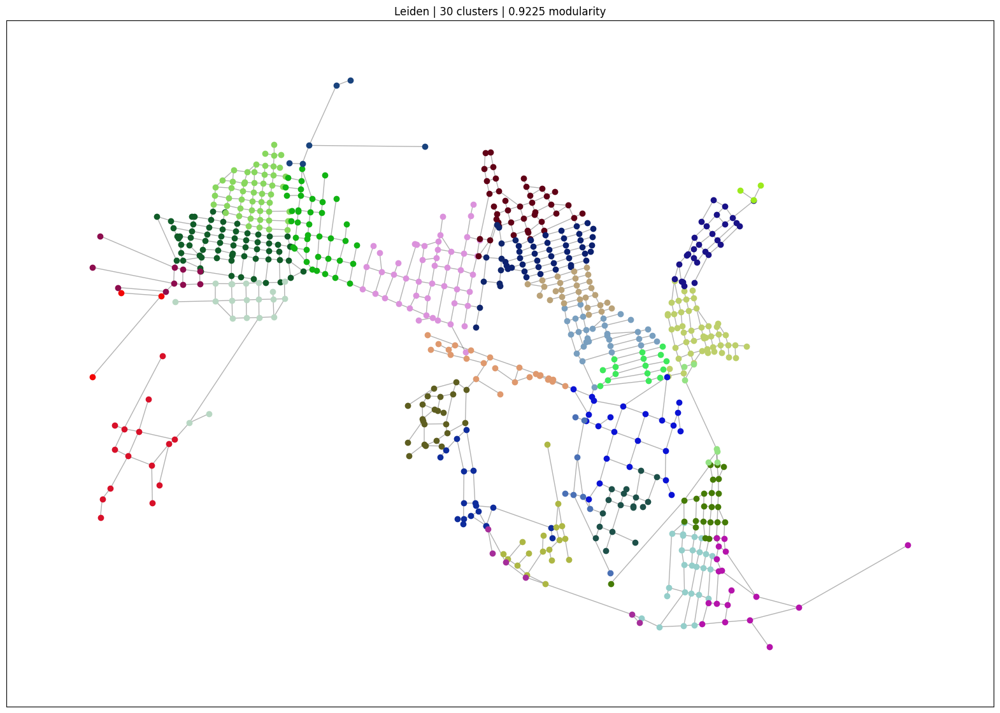

In [7]:
import leidenalg as la

seed = 0

communities = clustering.leiden(G, partition_type=la.ModularityVertexPartition, seed=seed, weights='length')
score = nx.community.modularity(G, communities, weight='length')
print(f'Modularity: {score:.5f}')

plot_communities(communities, 'Leiden')

## Filtration

 --- k=3 --- 
Louvain Modularity: 0.93929
Leiden Modularity: 0.93993
 --- k=5 --- 
Louvain Modularity: 0.91876
Leiden Modularity: 0.91879
 --- k=7 --- 
Louvain Modularity: 0.90396
Leiden Modularity: 0.90672
 --- k=10 --- 
Louvain Modularity: 0.88045
Leiden Modularity: 0.88541
 --- k=15 --- 
Louvain Modularity: 0.85447
Leiden Modularity: 0.85759


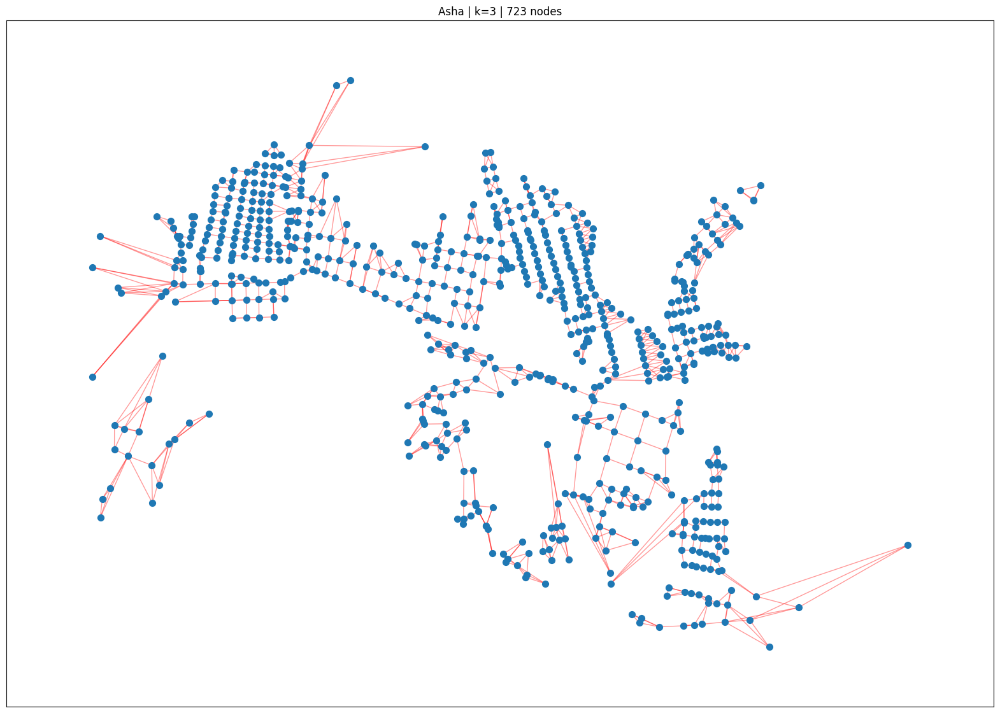

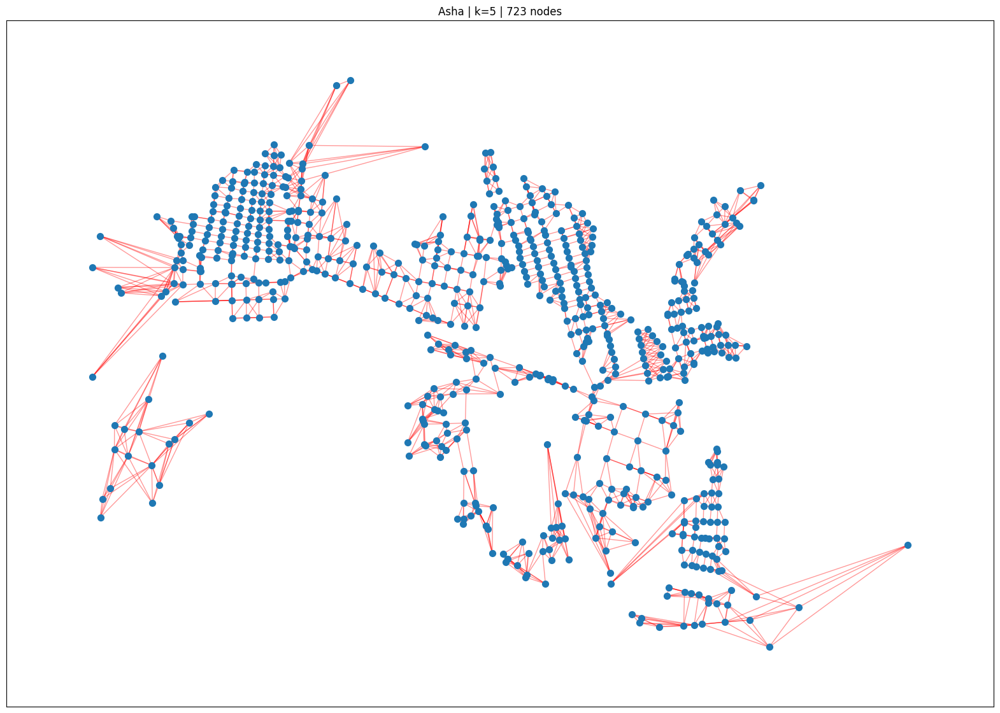

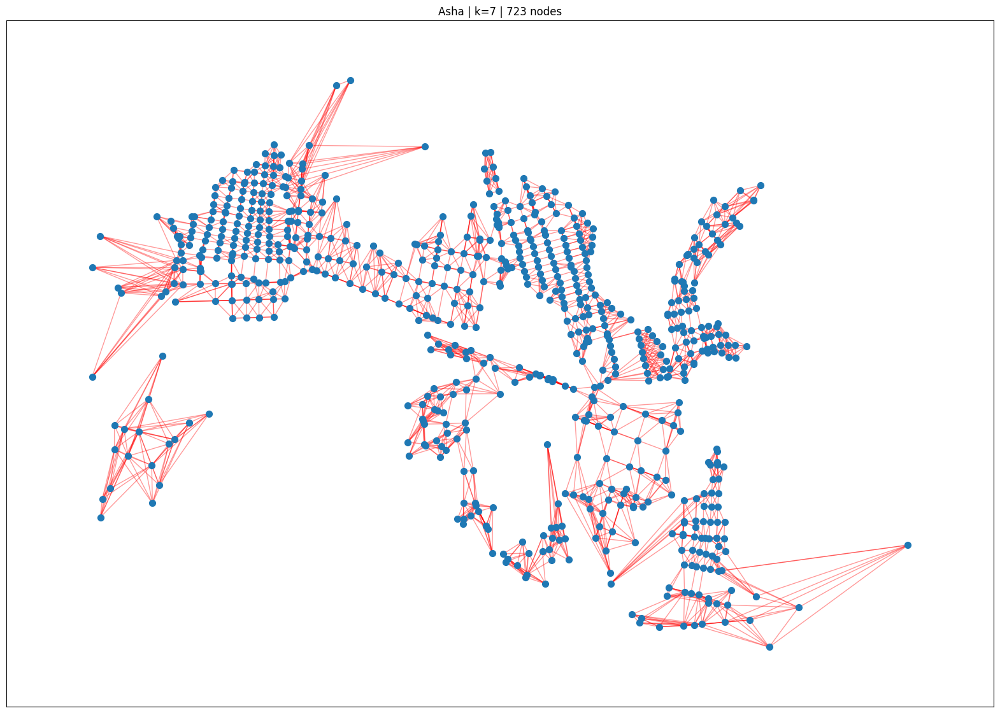

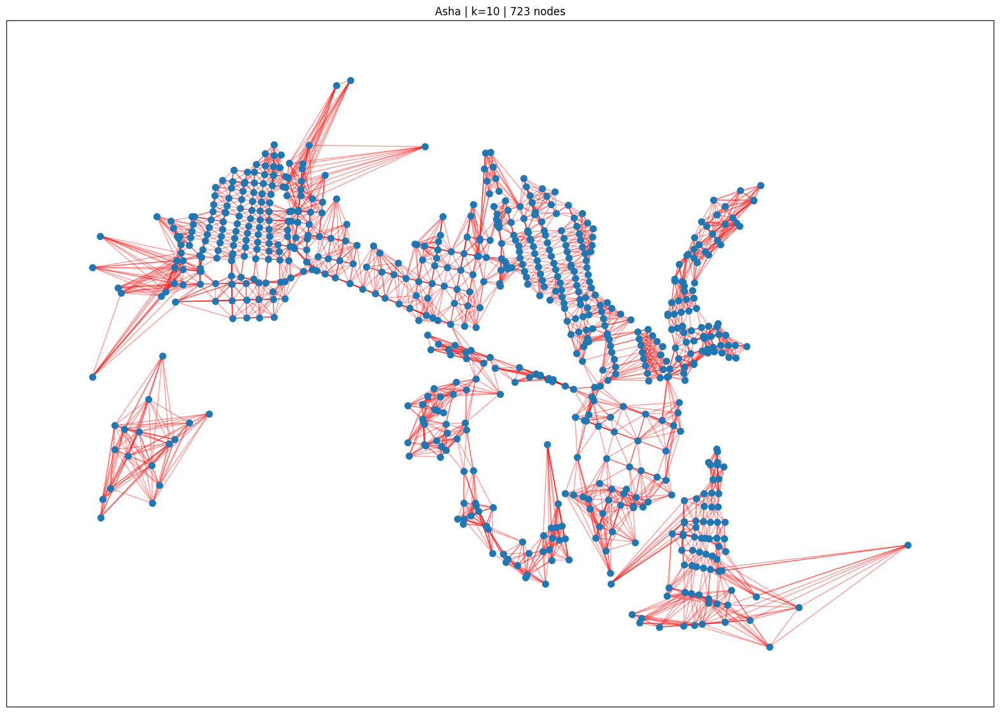

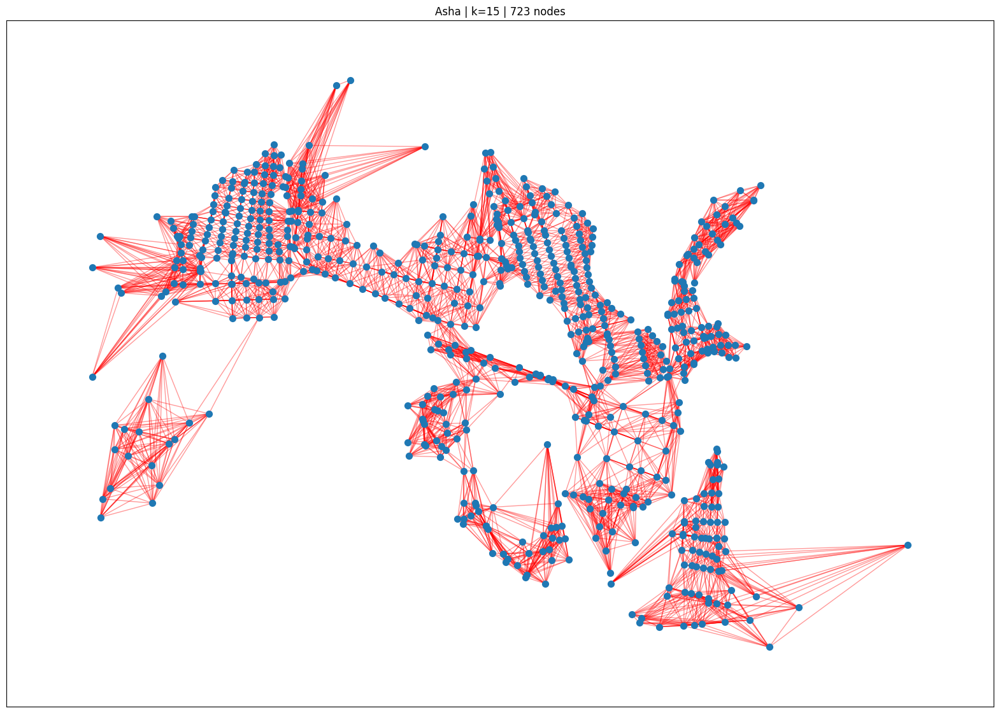

In [8]:
knn_graph = {k : build_knn_graph(G, k=k, weight='length') for k in [3, 5, 7, 10, 15]}

for k, G_knn in knn_graph.items():
    print(f' --- k={k} --- ')

    plt.figure(figsize=(20, 14))
    nx.draw_networkx_nodes(G, pos, node_size=50)
    nx.draw_networkx_edges(G_knn, pos, alpha=0.4, edge_color='r')
    plt.title(f'Asha | k={k} | {len(G.nodes)} nodes')

    communities = nx.community.louvain_communities(G_knn, weight='length')
    score = nx.community.modularity(G_knn, communities, weight='length')
    print(f'Louvain Modularity: {score:.5f}')

    communities = clustering.leiden(G_knn, partition_type=la.ModularityVertexPartition, seed=seed, weights='length')
    score = nx.community.modularity(G_knn, communities, weight='length')
    print(f'Leiden Modularity: {score:.5f}')

 --- k=3 --- 


Performing Filtration Clustering


100%|██████████| 100/100 [00:29<00:00,  3.34it/s]


Finding best clustering


100%|██████████| 100/100 [00:00<00:00, 529.80it/s]

Best threshold 89.8800 with score: 0.8797952963219242


k = 3 | Modularity: 0.89100
 --- k=5 --- 
Performing Filtration Clustering


100%|██████████| 100/100 [00:38<00:00,  2.63it/s]


Finding best clustering


100%|██████████| 100/100 [00:00<00:00, 436.00it/s]


Best threshold 2456.0039 with score: 0.8686780086498612
k = 5 | Modularity: 0.87532
 --- k=7 --- 
Performing Filtration Clustering


100%|██████████| 100/100 [00:40<00:00,  2.44it/s]


Finding best clustering


100%|██████████| 100/100 [00:00<00:00, 381.56it/s]


Best threshold 93.5548 with score: 0.8155949385804211
k = 7 | Modularity: 0.84163
 --- k=10 --- 
Performing Filtration Clustering


100%|██████████| 100/100 [00:58<00:00,  1.72it/s]


Finding best clustering


100%|██████████| 100/100 [00:00<00:00, 311.67it/s]


Best threshold 105.4654 with score: 0.7646389546374313
k = 10 | Modularity: 0.78088
 --- k=15 --- 
Performing Filtration Clustering


100%|██████████| 100/100 [01:05<00:00,  1.54it/s]


Finding best clustering


100%|██████████| 100/100 [00:00<00:00, 244.84it/s]


Best threshold 307.9558 with score: 0.6762434630324397
k = 15 | Modularity: 0.68210


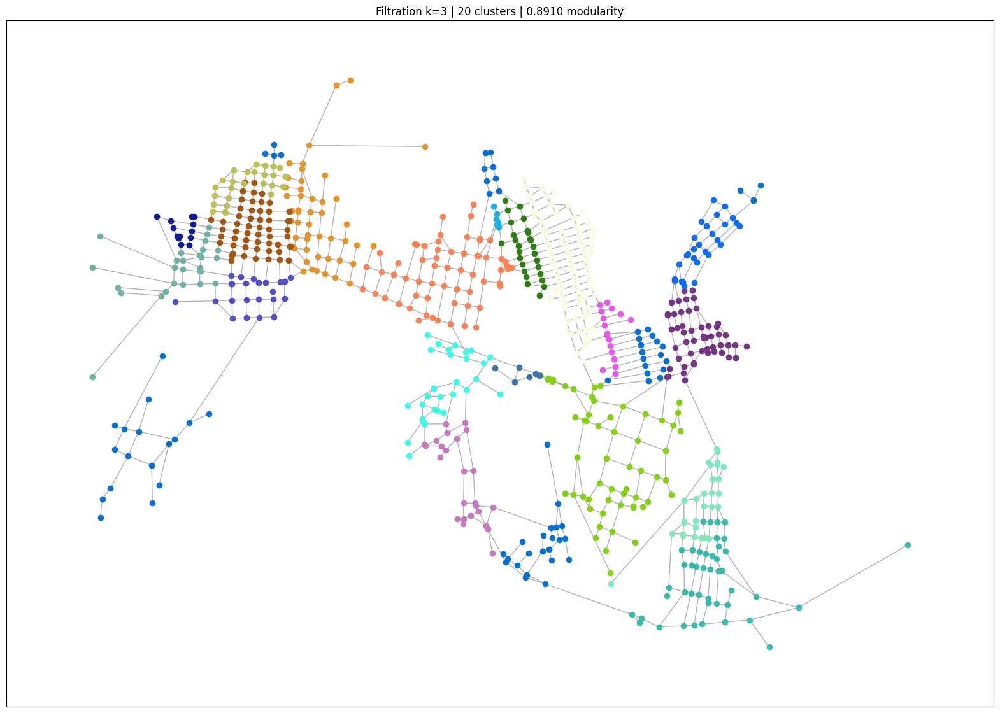

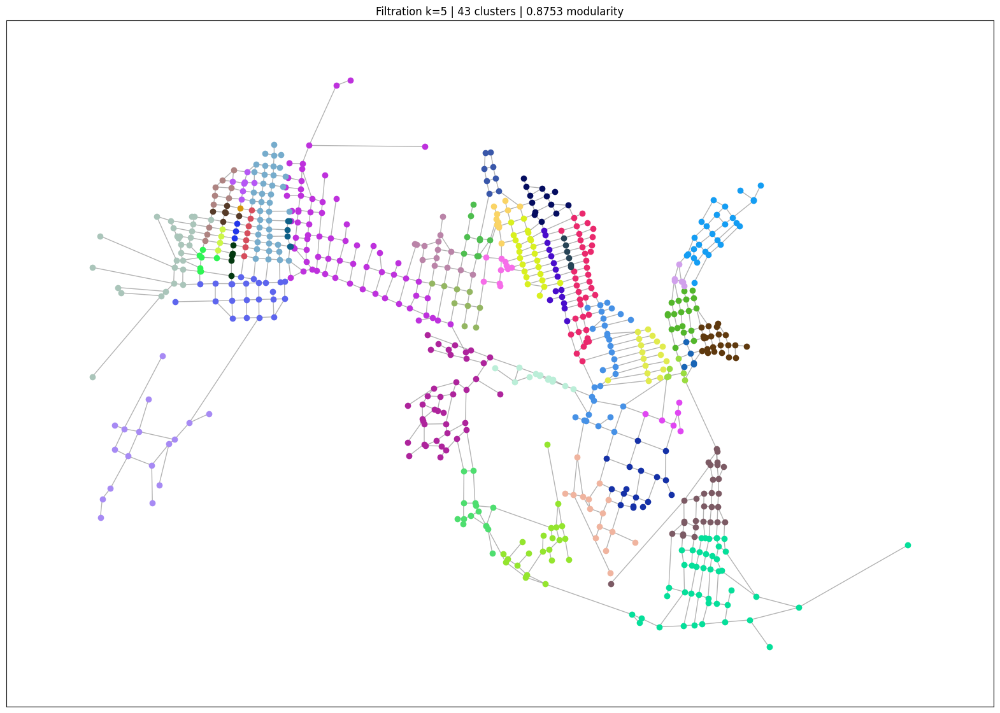

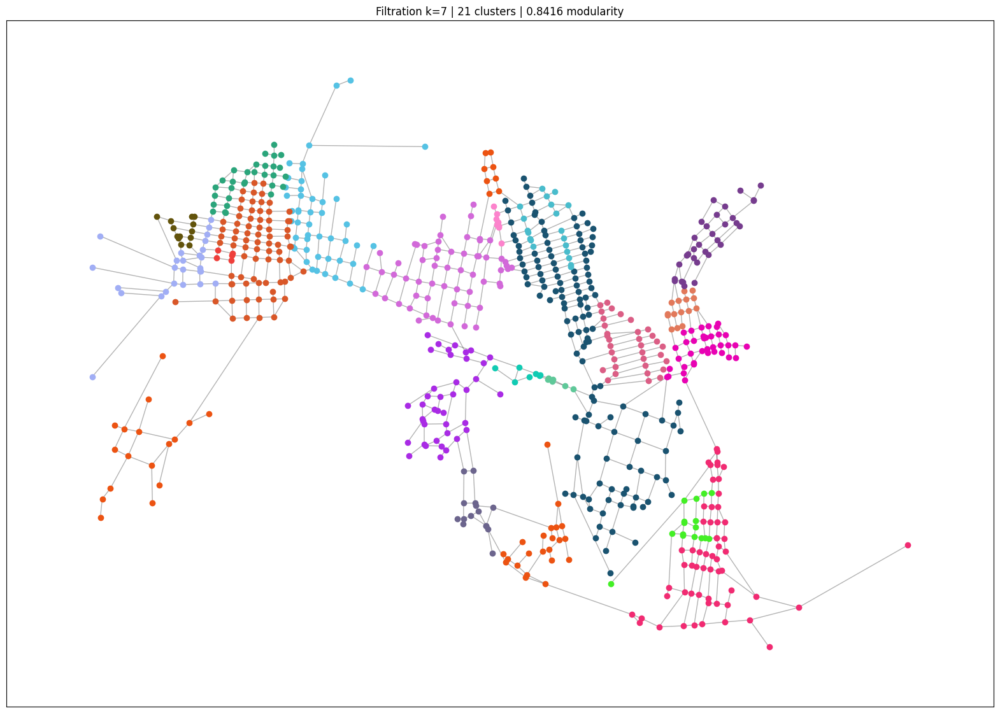

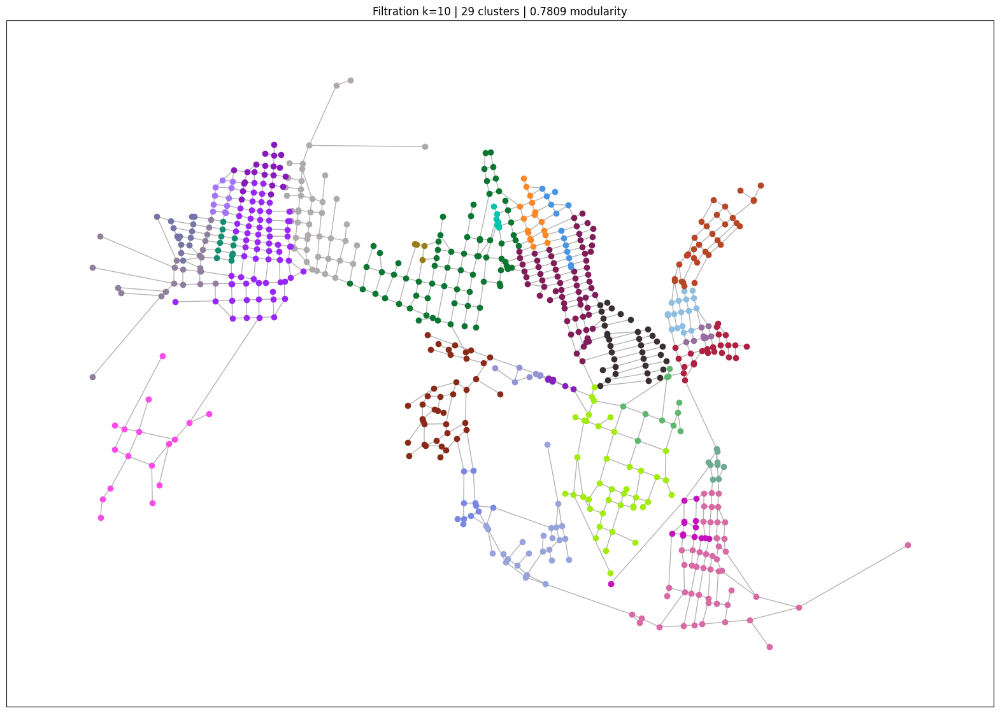

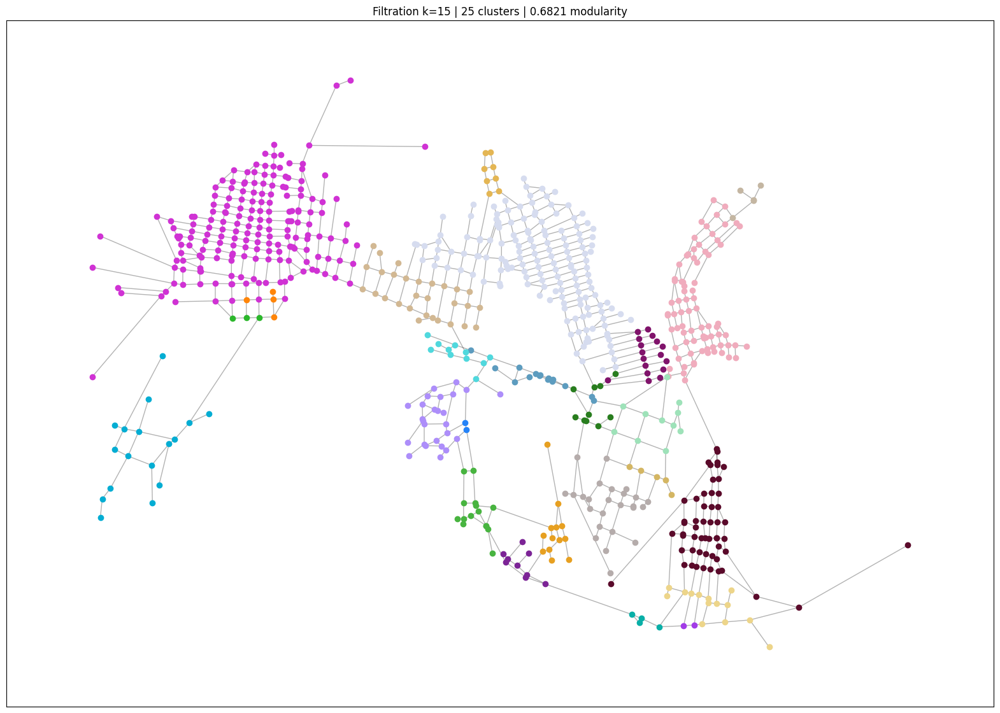

In [9]:
np.random.seed(0)

for k, G_knn in knn_graph.items():
    print(f' --- k={k} --- ')
    fc = FiltrationClustering(G_knn)
    communities = fc.cluster(n_jobs=N_JOBS)
    

    score = nx.community.modularity(G_knn, communities, weight='length')
    print(f'k = {k} | Modularity: {score:.5f}')

    plot_communities(communities, f'Filtration k={k}')

# KRG

Text(0.5, 1.0, 'Karaganda | 3345 nodes')

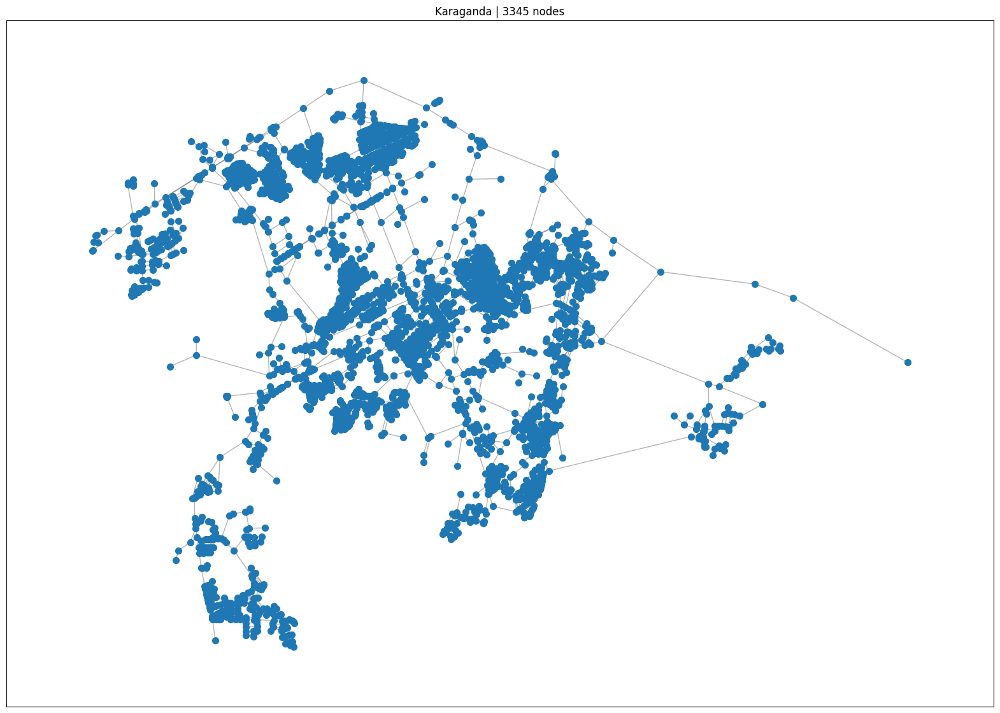

In [10]:
CITY = 'KRG'
GRAPH_ID = graph_osm_loader.cities[CITY] # KRG

# примеры id есть в graph_osm_loader.py
G = graph_osm_loader.get_graph(GRAPH_ID) # загрузка графа

pos = {u: [d['x'], d['y']] for u,d in G.nodes(data=True)} 

A = nx.adjacency_matrix(G, weight='length').todense()


plt.figure(figsize=(20, 14))
nx.draw_networkx_nodes(G, pos, node_size=50)
nx.draw_networkx_edges(G, pos, alpha=0.3)
plt.title(f'Karaganda | {len(G.nodes)} nodes')

In [11]:
d_dict = dict(nx.all_pairs_dijkstra_path_length(G, weight='length'))
d_matrix = np.zeros((len(G.nodes), len(G.nodes)))
id_to_order = {id : order for order, id in enumerate(G.nodes)}

for row in d_dict:
    for v in d_dict[row]:
        d_matrix[id_to_order[row]][id_to_order[v]] = d_dict[row][v]

## Louvain

In [12]:
communities = nx.community.louvain_communities(G, weight='length')
score = nx.community.modularity(G, communities, weight='length')
print(f'Modularity: {score:.5f}')

Modularity: 0.96516


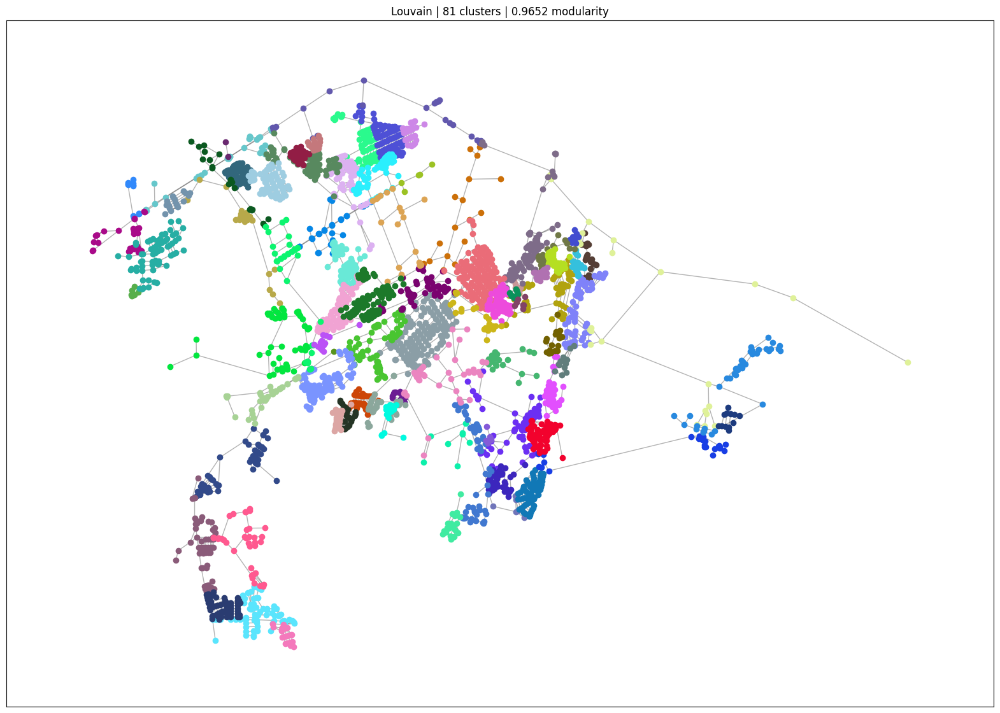

In [13]:
def plot_communities(communities, algo_name=''):
    plt.figure(figsize=(20, 14))

    nx.draw_networkx_edges(G, pos, alpha=0.3)

    for j, cluster in enumerate(communities):
        color = '#%06X' % randint(0, 0xFFFFFF)
        for v in cluster:
            point = pos[v]
            plt.scatter(point[0], point[1], c=color)

    plt.title(f'{algo_name} | {len(communities)} clusters | {score:.4f} modularity')

plot_communities(communities, 'Louvain')

## Leiden

Modularity: 0.96612


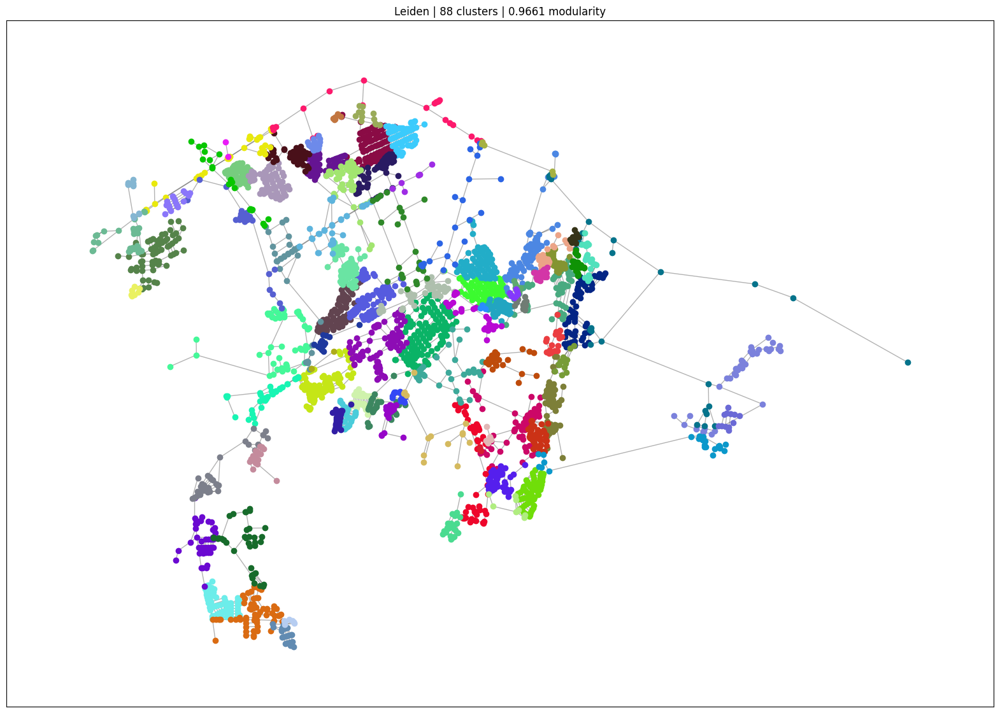

In [14]:
import leidenalg as la

seed = 0

communities = clustering.leiden(G, partition_type=la.ModularityVertexPartition, seed=seed, weights='length')
score = nx.community.modularity(G, communities, weight='length')
print(f'Modularity: {score:.5f}')

plot_communities(communities, 'Leiden')

## Filtration

 --- k=3 --- 
Louvain Modularity: 0.98238
Leiden Modularity: 0.98247
 --- k=5 --- 
Louvain Modularity: 0.97118
Leiden Modularity: 0.97118
 --- k=7 --- 
Louvain Modularity: 0.96220
Leiden Modularity: 0.96381
 --- k=10 --- 
Louvain Modularity: 0.95149
Leiden Modularity: 0.95252
 --- k=15 --- 
Louvain Modularity: 0.94028
Leiden Modularity: 0.94111


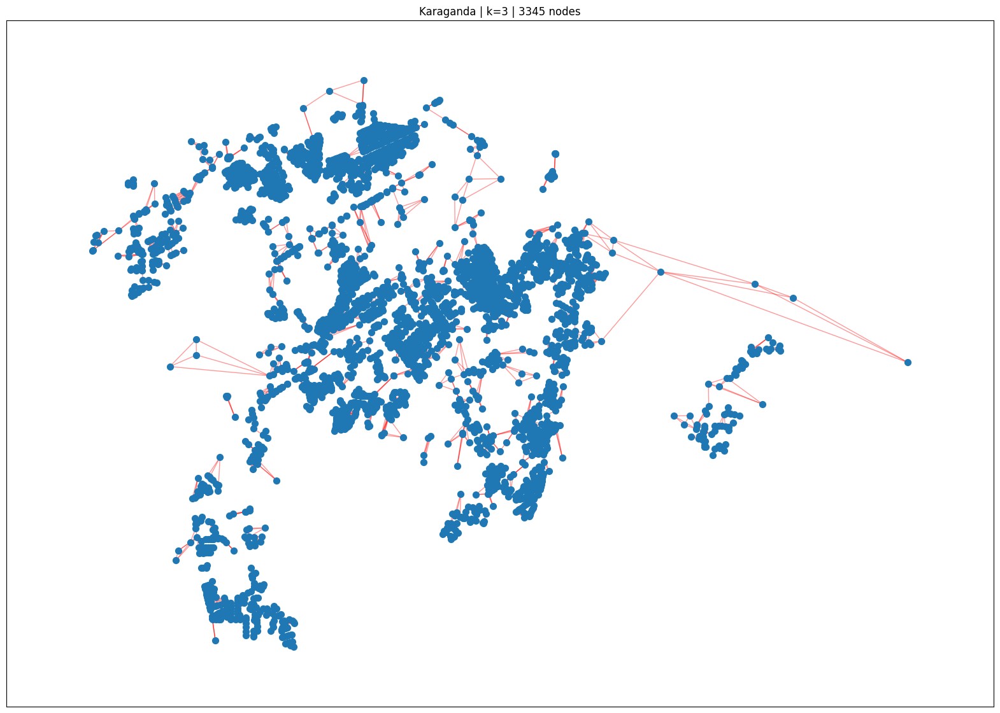

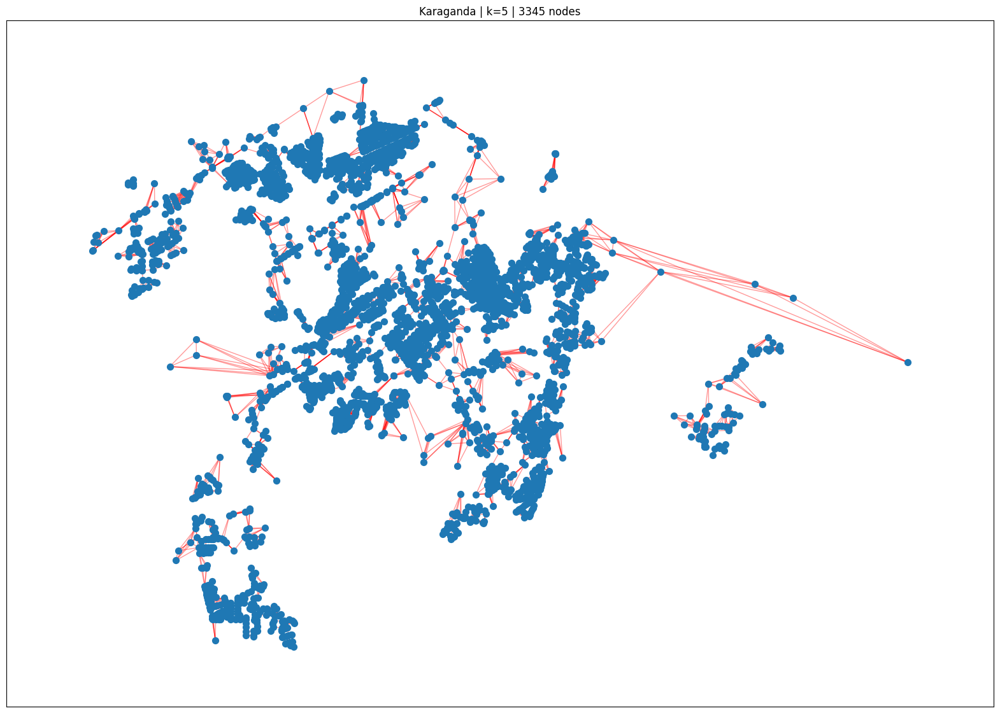

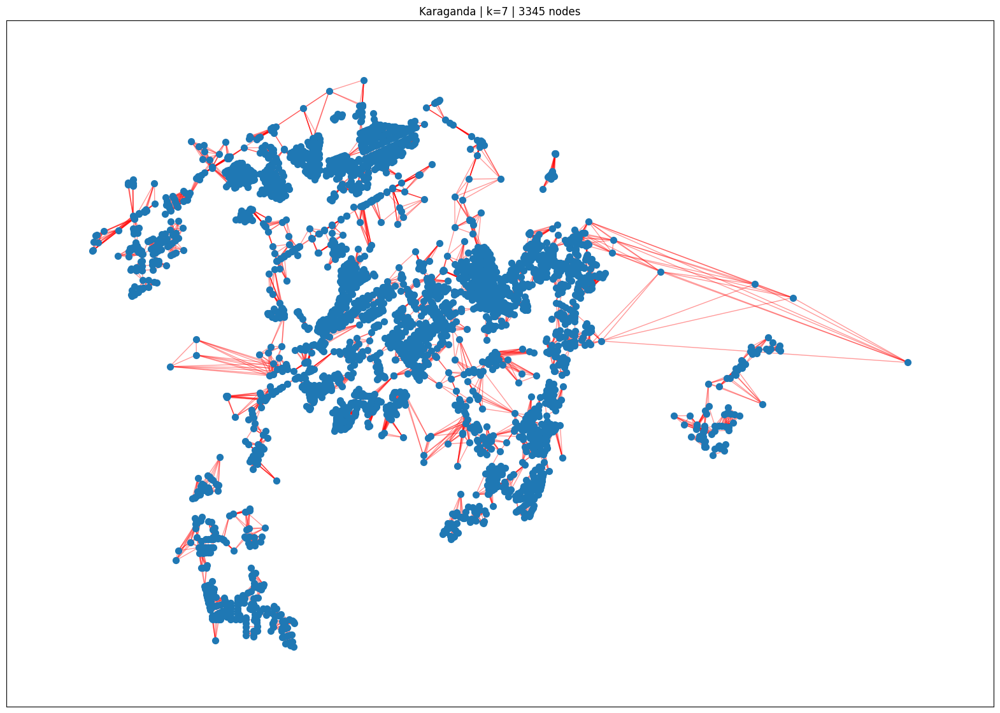

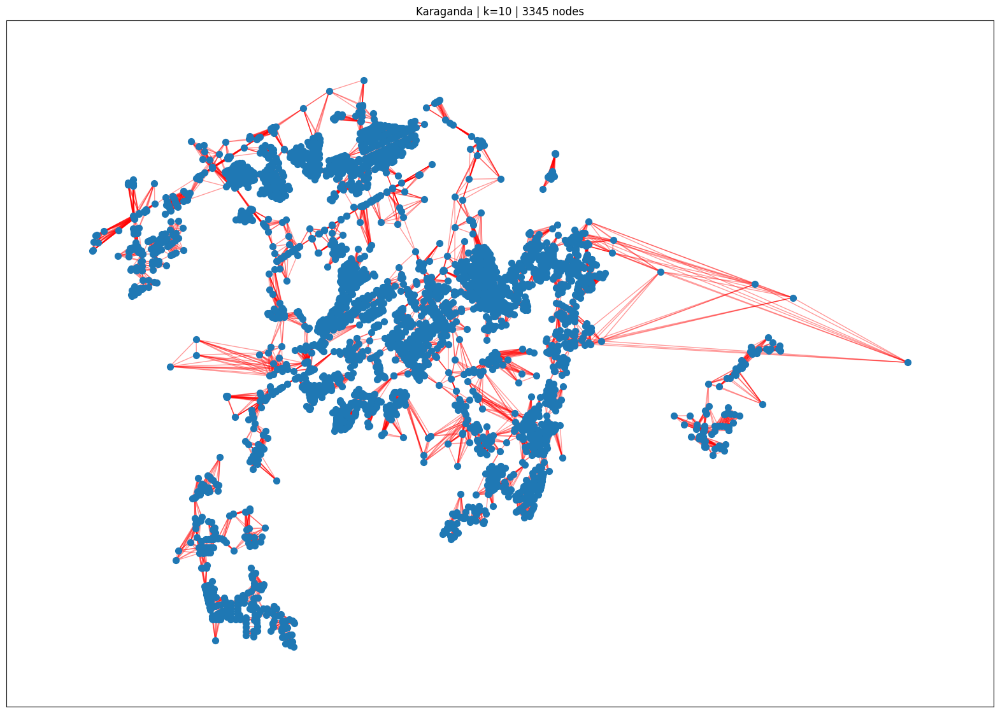

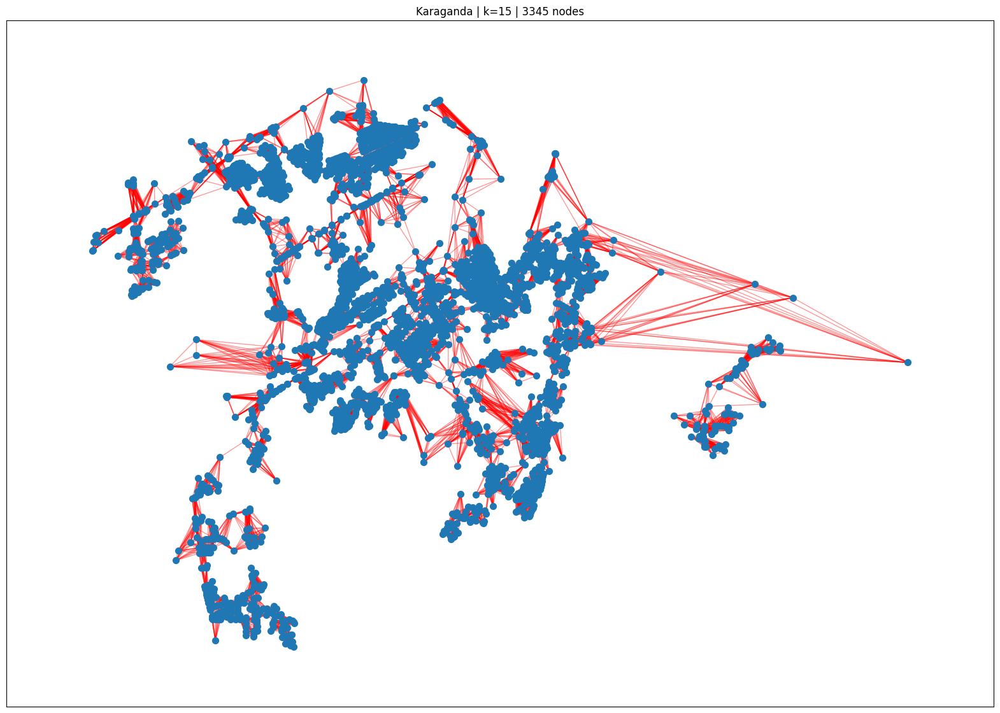

In [15]:
knn_graph = {k : build_knn_graph(G, k=k, weight='length') for k in [3, 5, 7, 10, 15]}

for k, G_knn in knn_graph.items():
    print(f' --- k={k} --- ')

    plt.figure(figsize=(20, 14))
    nx.draw_networkx_nodes(G, pos, node_size=50)
    nx.draw_networkx_edges(G_knn, pos, alpha=0.4, edge_color='r')
    plt.title(f'Karaganda | k={k} | {len(G.nodes)} nodes')

    communities = nx.community.louvain_communities(G_knn, weight='length')
    score = nx.community.modularity(G_knn, communities, weight='length')
    print(f'Louvain Modularity: {score:.5f}')

    communities = clustering.leiden(G_knn, partition_type=la.ModularityVertexPartition, seed=seed, weights='length')
    score = nx.community.modularity(G_knn, communities, weight='length')
    print(f'Leiden Modularity: {score:.5f}')

 --- k=3 --- 
Performing Filtration Clustering


 32%|███▏      | 32/100 [00:03<00:07,  8.76it/s]/home/esabitov/miniconda3/envs/graph_clusterng/lib/python3.12/site-packages/joblib/externals/loky/process_executor.py:752: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(
100%|██████████| 100/100 [01:47<00:00,  1.08s/it]


Finding best clustering


100%|██████████| 100/100 [00:00<00:00, 102.85it/s]


Best threshold 110.3442 with score: 0.8995367221479467
k = 3 | Modularity: 0.90172
 --- k=5 --- 
Performing Filtration Clustering


100%|██████████| 100/100 [03:34<00:00,  2.14s/it]


Finding best clustering


100%|██████████| 100/100 [00:01<00:00, 87.40it/s]


Best threshold 13625.3777 with score: 0.9125422606065481
k = 5 | Modularity: 0.92015
 --- k=7 --- 
Performing Filtration Clustering


100%|██████████| 100/100 [04:36<00:00,  2.77s/it]


Finding best clustering


100%|██████████| 100/100 [00:01<00:00, 75.02it/s]


Best threshold 14329.8026 with score: 0.940924873733267
k = 7 | Modularity: 0.94238
 --- k=10 --- 
Performing Filtration Clustering


100%|██████████| 100/100 [09:38<00:00,  5.79s/it]


Finding best clustering


100%|██████████| 100/100 [00:01<00:00, 62.13it/s]


Best threshold 1433.0230 with score: 0.8755550898115264
k = 10 | Modularity: 0.87966
 --- k=15 --- 
Performing Filtration Clustering


100%|██████████| 100/100 [21:06<00:00, 12.67s/it]


Finding best clustering


100%|██████████| 100/100 [00:02<00:00, 47.54it/s]


Best threshold 2082.0997 with score: 0.8427550688670921
k = 15 | Modularity: 0.84815


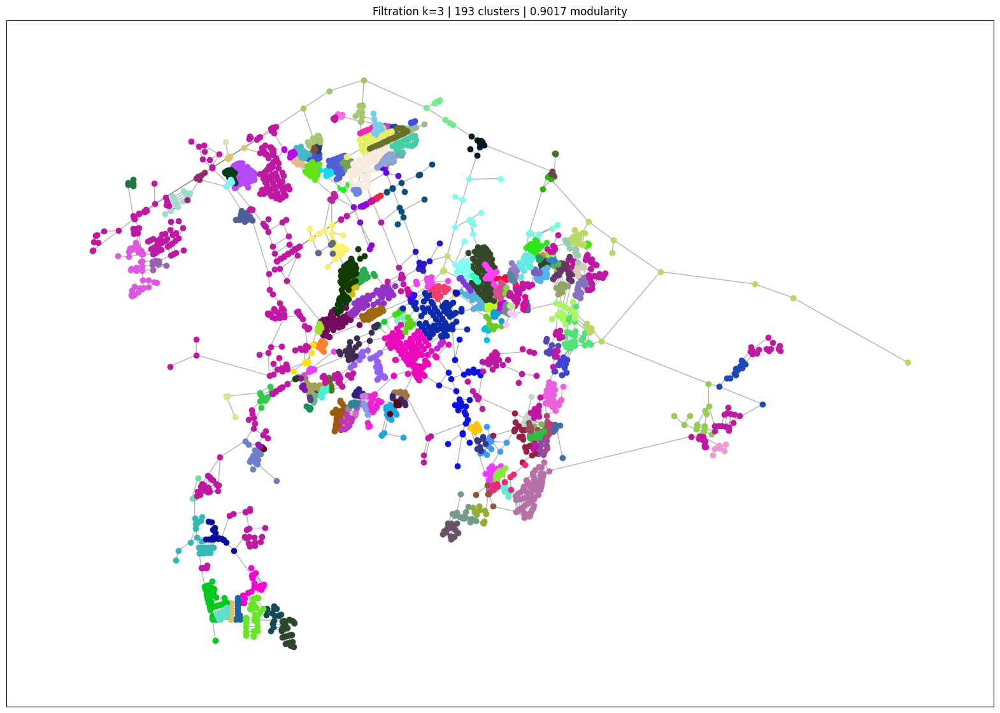

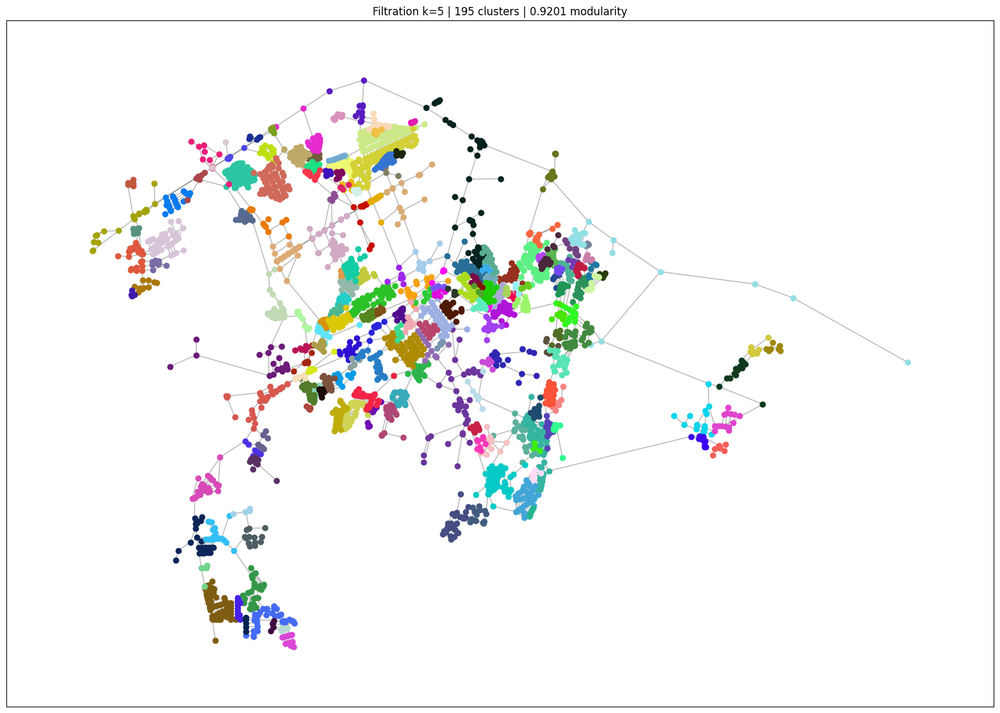

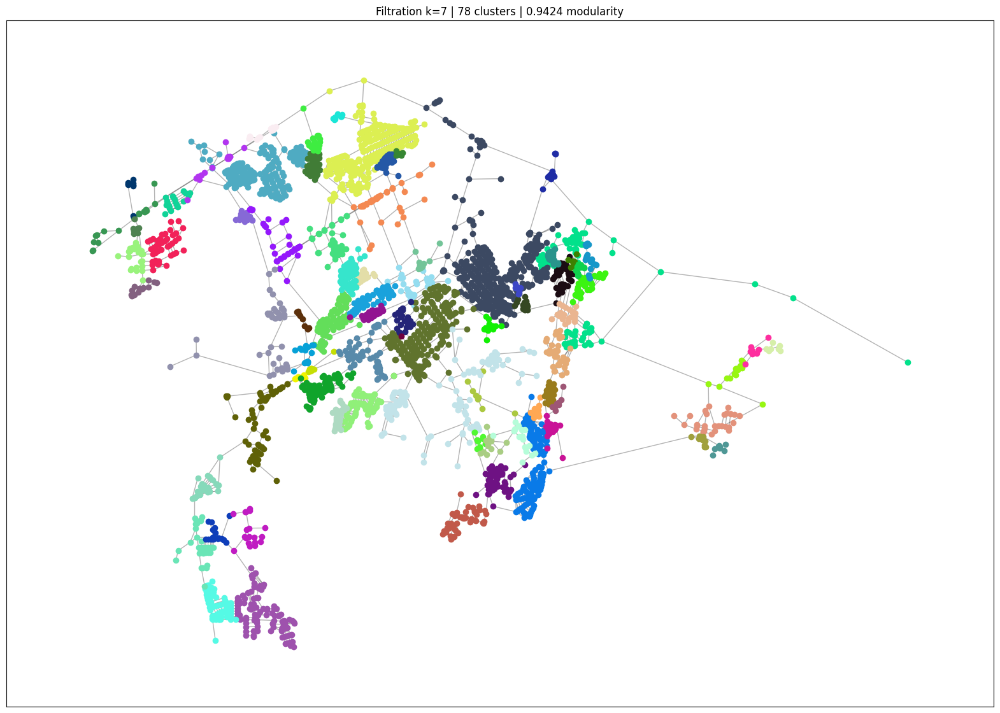

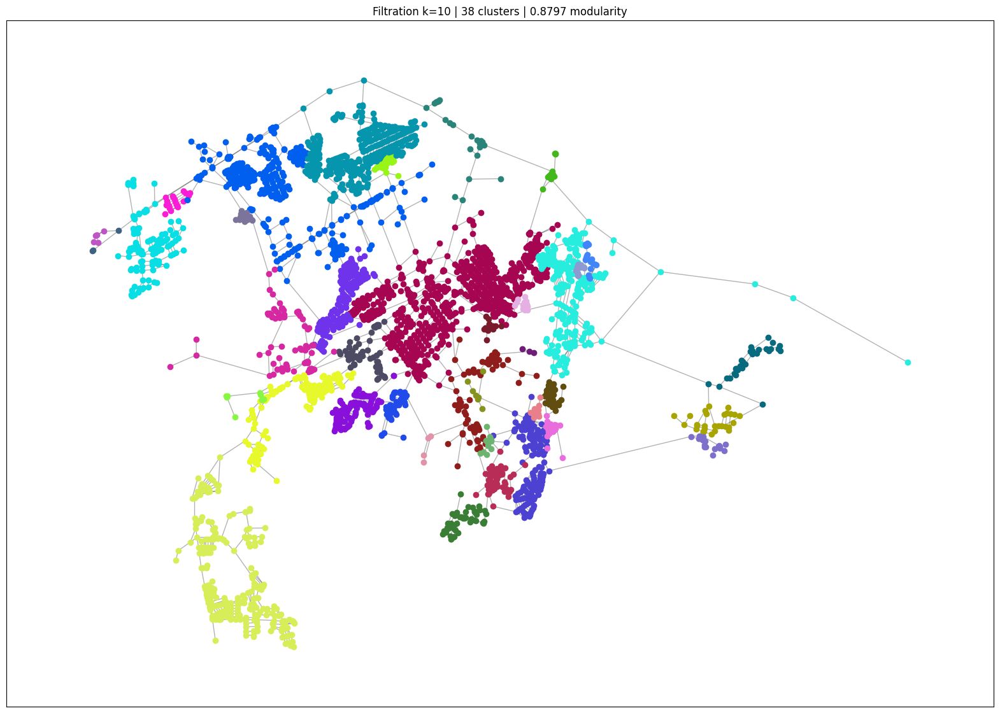

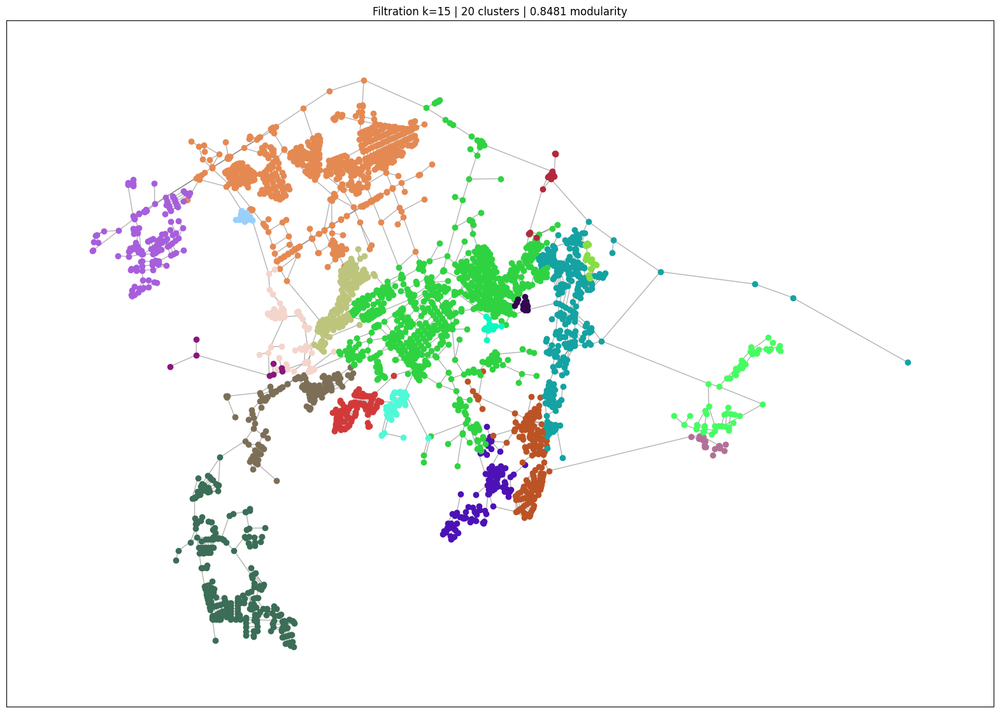

In [16]:
np.random.seed(0)

for k, G_knn in knn_graph.items():
    print(f' --- k={k} --- ')
    fc = FiltrationClustering(G_knn)
    communities = fc.cluster(n_jobs=N_JOBS)

    score = nx.community.modularity(G_knn, communities, weight='length')
    print(f'k = {k} | Modularity: {score:.5f}')

    plot_communities(communities, f'Filtration k={k}')

# EKB

Text(0.5, 1.0, 'Ekaterinburg | 5608 nodes')

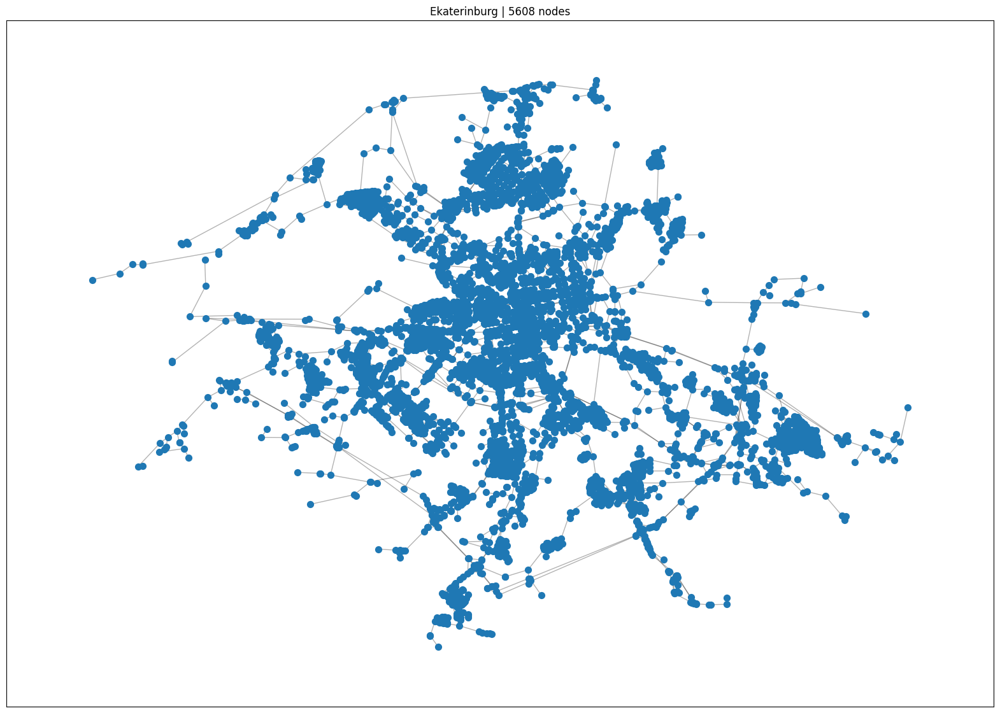

In [17]:
CITY = 'EKB'
GRAPH_ID = graph_osm_loader.cities[CITY] # KRG

# примеры id есть в graph_osm_loader.py
G = graph_osm_loader.get_graph(GRAPH_ID) # загрузка графа

pos = {u: [d['x'], d['y']] for u,d in G.nodes(data=True)} 

A = nx.adjacency_matrix(G, weight='length').todense()


plt.figure(figsize=(20, 14))
nx.draw_networkx_nodes(G, pos, node_size=50)
nx.draw_networkx_edges(G, pos, alpha=0.3)
plt.title(f'Ekaterinburg | {len(G.nodes)} nodes')

In [18]:
d_dict = dict(nx.all_pairs_dijkstra_path_length(G, weight='length'))
d_matrix = np.zeros((len(G.nodes), len(G.nodes)))
id_to_order = {id : order for order, id in enumerate(G.nodes)}

for row in d_dict:
    for v in d_dict[row]:
        d_matrix[id_to_order[row]][id_to_order[v]] = d_dict[row][v]

## Louvain

In [19]:
communities = nx.community.louvain_communities(G, weight='length')
score = nx.community.modularity(G, communities, weight='length')
print(f'Modularity: {score:.5f}')

Modularity: 0.97107


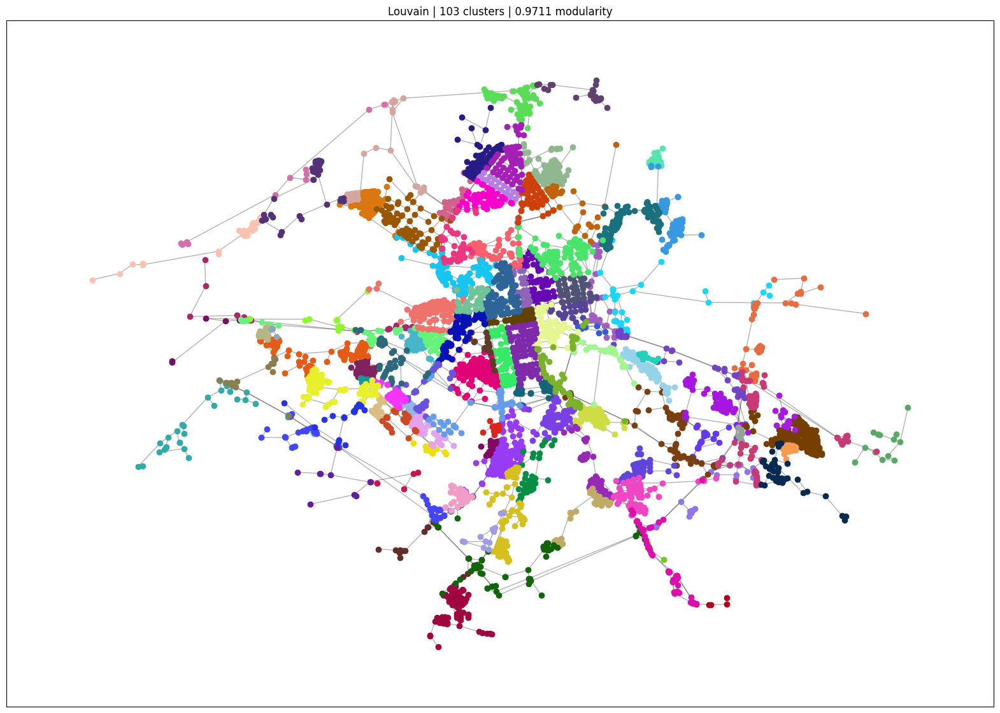

In [20]:
def plot_communities(communities, algo_name=''):
    plt.figure(figsize=(20, 14))

    nx.draw_networkx_edges(G, pos, alpha=0.3)

    for j, cluster in enumerate(communities):
        color = '#%06X' % randint(0, 0xFFFFFF)
        for v in cluster:
            point = pos[v]
            plt.scatter(point[0], point[1], c=color)

    plt.title(f'{algo_name} | {len(communities)} clusters | {score:.4f} modularity')

plot_communities(communities, 'Louvain')

## Leiden

Modularity: 0.97145


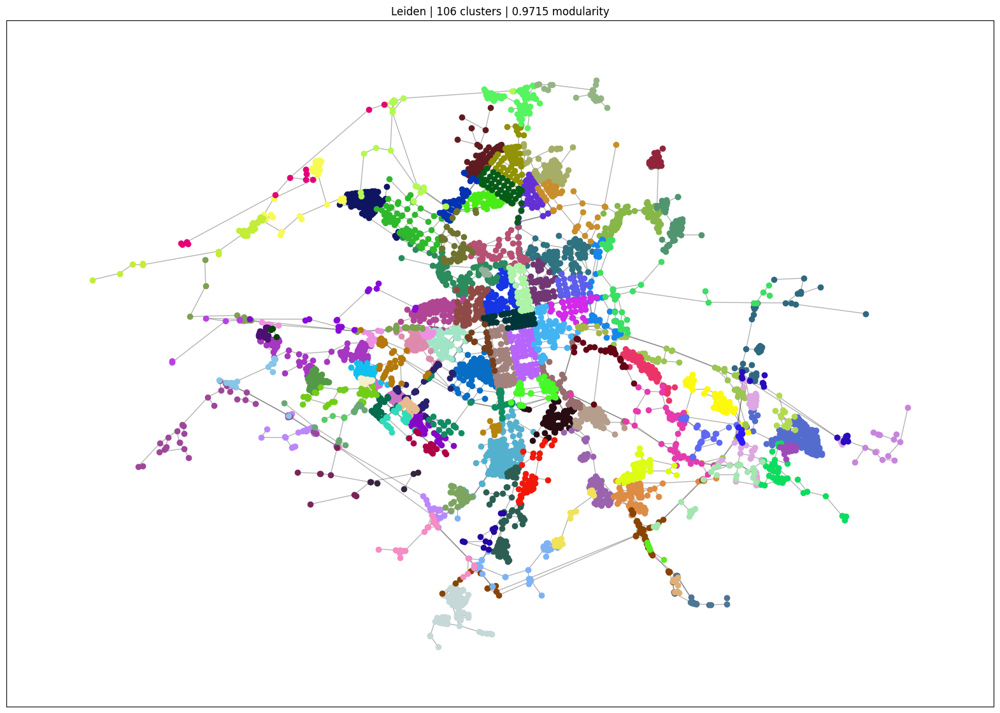

In [21]:
import leidenalg as la

seed = 0

communities = clustering.leiden(G, partition_type=la.ModularityVertexPartition, seed=seed, weights='length')
score = nx.community.modularity(G, communities, weight='length')
print(f'Modularity: {score:.5f}')

plot_communities(communities, 'Leiden')

## Filtration

 --- k=3 --- 
Louvain Modularity: 0.98739
Leiden Modularity: 0.98757
 --- k=5 --- 
Louvain Modularity: 0.97609
Leiden Modularity: 0.97639
 --- k=7 --- 
Louvain Modularity: 0.96864
Leiden Modularity: 0.96906
 --- k=10 --- 
Louvain Modularity: 0.95842
Leiden Modularity: 0.96017
 --- k=15 --- 
Louvain Modularity: 0.94550
Leiden Modularity: 0.94705


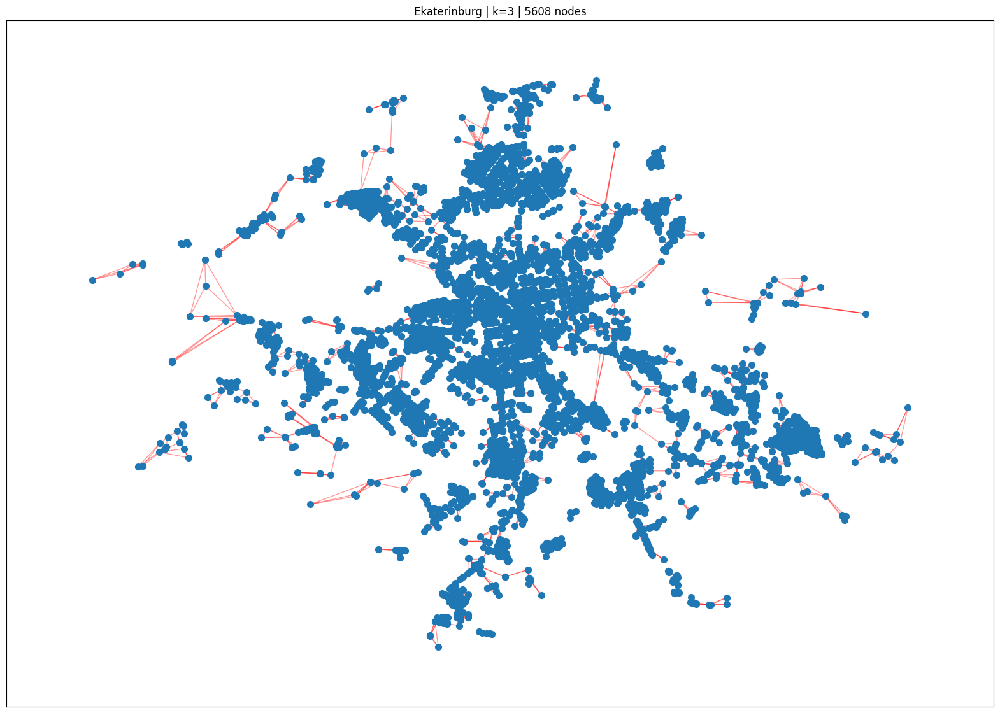

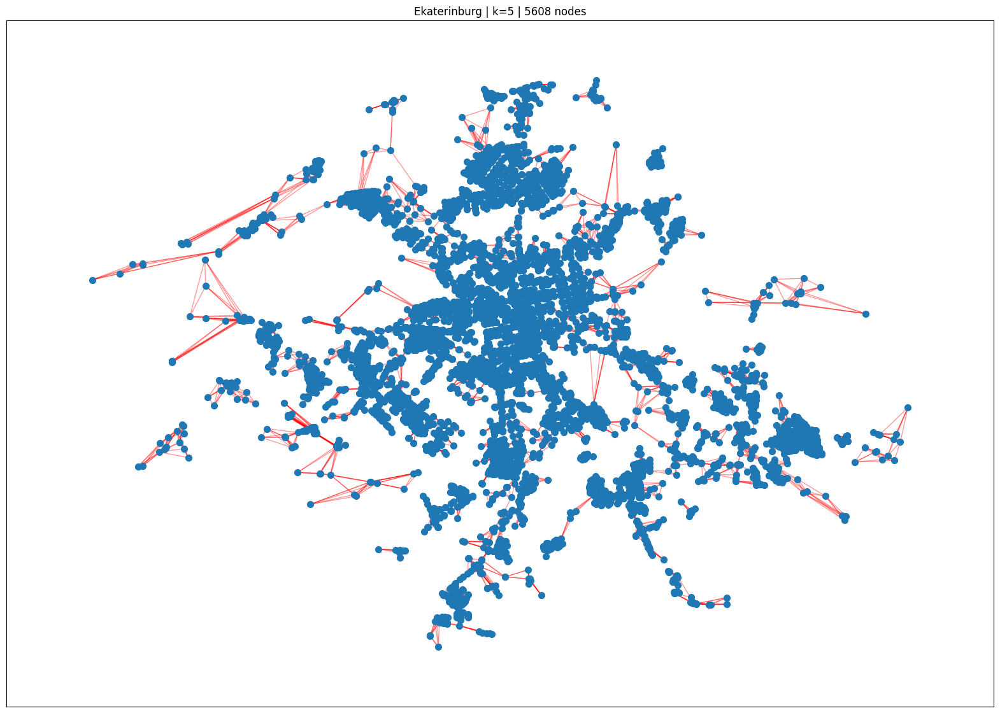

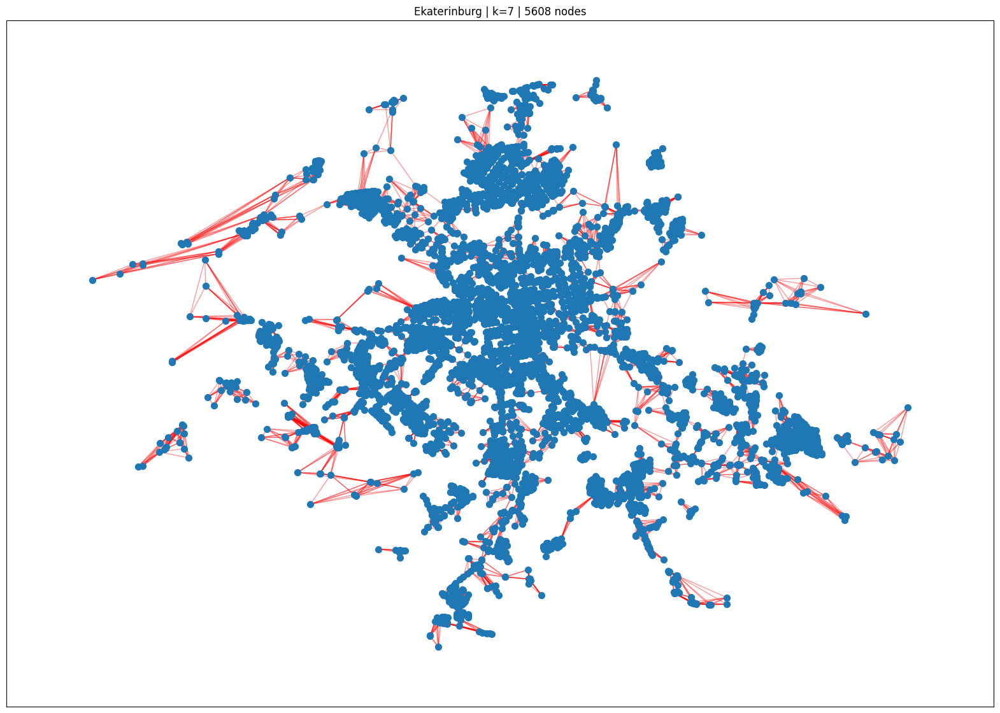

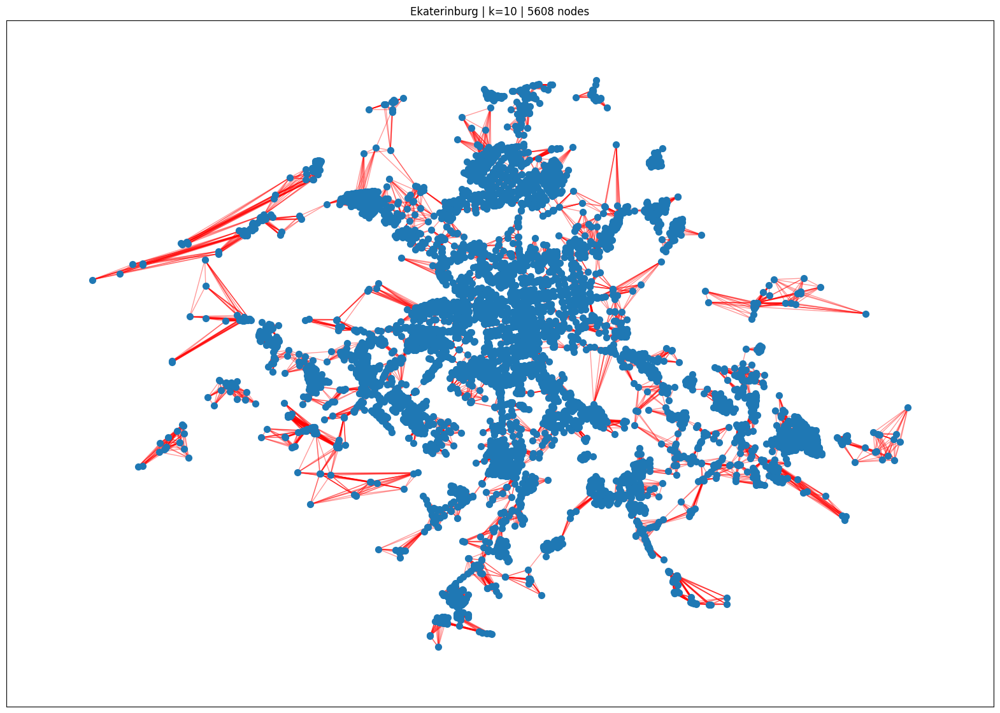

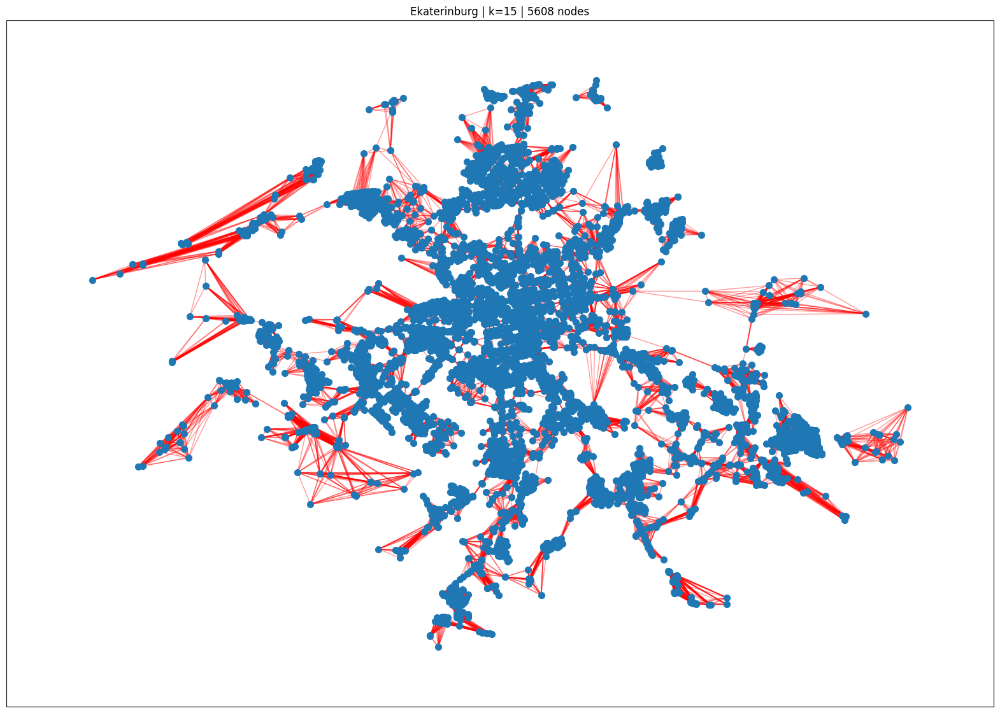

In [22]:
knn_graph = {k : build_knn_graph(G, k=k, weight='length') for k in [3, 5, 7, 10, 15]}

for k, G_knn in knn_graph.items():
    print(f' --- k={k} --- ')

    plt.figure(figsize=(20, 14))
    nx.draw_networkx_nodes(G, pos, node_size=50)
    nx.draw_networkx_edges(G_knn, pos, alpha=0.4, edge_color='r')
    plt.title(f'Ekaterinburg | k={k} | {len(G.nodes)} nodes')

    communities = nx.community.louvain_communities(G_knn, weight='length')
    score = nx.community.modularity(G_knn, communities, weight='length')
    print(f'Louvain Modularity: {score:.5f}')

    communities = clustering.leiden(G_knn, partition_type=la.ModularityVertexPartition, seed=seed, weights='length')
    score = nx.community.modularity(G_knn, communities, weight='length')
    print(f'Leiden Modularity: {score:.5f}')

In [ ]:
np.random.seed(0)

for k, G_knn in knn_graph.items():
    print(f' --- k={k} --- ')
    fc = FiltrationClustering(G_knn)
    communities = fc.cluster(n_jobs=N_JOBS)

    score = nx.community.modularity(G_knn, communities, weight='length')
    print(f'k = {k} | Modularity: {score:.5f}')

    plot_communities(communities, f'Filtration k={k}')

 --- k=3 --- 


Performing Filtration Clustering


100%|██████████| 100/100 [05:05<00:00,  3.06s/it]
